In [54]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
tf.__version__

'2.19.0'

In [55]:
modelo_base = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

In [56]:
modelo_base.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, None,      │        864 │ input_layer_1[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_94[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_94       │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, None,      │      9,216 │ activation_94[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_95[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_95       │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, None,      │     18,432 │ activation_95[0]… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_96[0][0]   │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, None,      │          0 │ activation_96[0]… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, None,      │      5,120 │ max_pooling2d_4[… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_97[0][0]   │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, None,      │    138,240 │ activation_97[0]… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_98[0][0]   │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_98       │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [57]:
len(modelo_base.layers)

311

In [58]:
names = ['mixed3', 'mixed5'] #Relu

In [59]:
modelo_base.input

<KerasTensor shape=(None, None, None, 3), dtype=float32, sparse=False, ragged=False, name=keras_tensor_311>

In [60]:
layers = [modelo_base.get_layer(nome).output for nome in names]
layers

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_411>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_475>]

In [61]:
deep_dream = tf.keras.Model(inputs = modelo_base.input, outputs = layers)

In [62]:
deep_dream.output

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_411>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_475>]

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [63]:
imagem = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/Colab Notebooks/Images/StaryNight.jpg', target_size=(255,375))

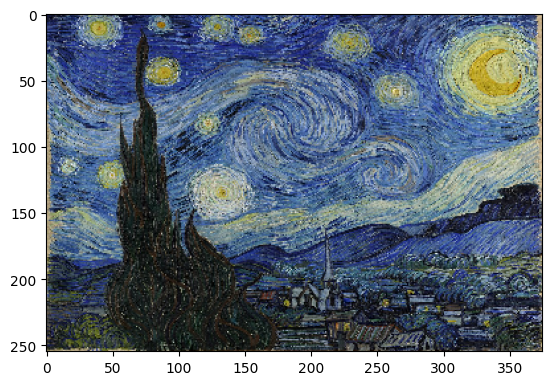

In [64]:
plt.imshow(imagem)

In [65]:
imagem.size

(375, 255)

In [66]:
imagem = tf.keras.preprocessing.image.img_to_array(imagem)

In [67]:
type(imagem)

numpy.ndarray

In [68]:
imagem.shape

(255, 375, 3)

In [69]:
imagem.min(), imagem.max()

(np.float32(0.0), np.float32(255.0))

In [70]:
#imagem = imagem / 255
imagem = tf.keras.applications.inception_v3.preprocess_input(imagem)

In [71]:
imagem.min(), imagem.max()

(np.float32(-1.0), np.float32(1.0))

#Ativações de rede neural

In [72]:
imagem_batch = tf.expand_dims(imagem, axis=0)
imagem_batch.shape

TensorShape([1, 255, 375, 3])

In [73]:
ativacoes = deep_dream.predict(imagem_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [74]:
deep_dream.outputs

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_411>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, ragged=False, name=keras_tensor_475>]

In [75]:
ativacoes[0]

array([[[[0.1949045 , 0.5370304 , 0.        , ..., 3.010371  ,
          0.0409255 , 1.0168581 ],
         [0.21338752, 0.        , 1.5931585 , ..., 0.99259937,
          0.        , 1.0168581 ],
         [1.7747554 , 0.        , 0.6371623 , ..., 1.924778  ,
          0.7832612 , 0.19773608],
         ...,
         [0.        , 0.        , 0.        , ..., 1.5247903 ,
          0.26909244, 0.16858637],
         [0.        , 0.        , 0.46013   , ..., 2.0288484 ,
          0.5204189 , 0.        ],
         [1.8447499 , 0.        , 0.16392732, ..., 2.139597  ,
          1.0429783 , 0.36967415]],

        [[0.        , 0.        , 0.        , ..., 1.9932768 ,
          0.0409255 , 0.7995043 ],
         [0.        , 0.41623765, 0.        , ..., 1.1823174 ,
          0.        , 0.25113612],
         [0.28505117, 0.        , 0.        , ..., 1.1823174 ,
          0.        , 0.20665187],
         ...,
         [1.0671861 , 0.        , 0.        , ..., 0.40473968,
          0.        , 0.7

#Cálculo do erro

In [76]:
def calcula_erro(imagem, network):
  imagem_batch = tf.expand_dims(imagem, axis = 0)
  ativacoes = network(imagem_batch)
  erros = []
  for ativacao in ativacoes:
    media = tf.math.reduce_mean(ativacao)
    erros.append(media)

  return tf.reduce_sum(erros)

In [77]:
0.45195404 + 0.16485052

0.6168045600000001

In [78]:
loss = calcula_erro(imagem, deep_dream)
loss

<tf.Tensor: shape=(), dtype=float32, numpy=0.614254355430603>

In [83]:
@tf.function
def deep_dream_(network, imagem, learning_rate):
  with tf.GradientTape() as tape:
    tape.watch(imagem)
    erro = calcula_erro(imagem, network)

  gradientes = tape.gradient(erro, imagem) # Derivada
  gradientes /= tf.math.reduce_std(gradientes)
  imagem = imagem + gradientes * learning_rate
  imagem = tf.clip_by_value(imagem, -1, 1)

  return erro, imagem

In [80]:
def converte_imagem(imagem):
  imagem = 255 * (imagem + 1.0) / 2.0
  return tf.cast(imagem, tf.uint8)

In [84]:
def executa_deep_dream(network, imagem, epocas, learning_rate):
  for epoca in range(epocas):
    erro, imagem = deep_dream_ (network, imagem, learning_rate)
    if epoca % 200 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(converte_imagem(imagem))
      plt.show()
      print('Época {}, loss {}'.format(epoca, erro))

#Geração de imagens

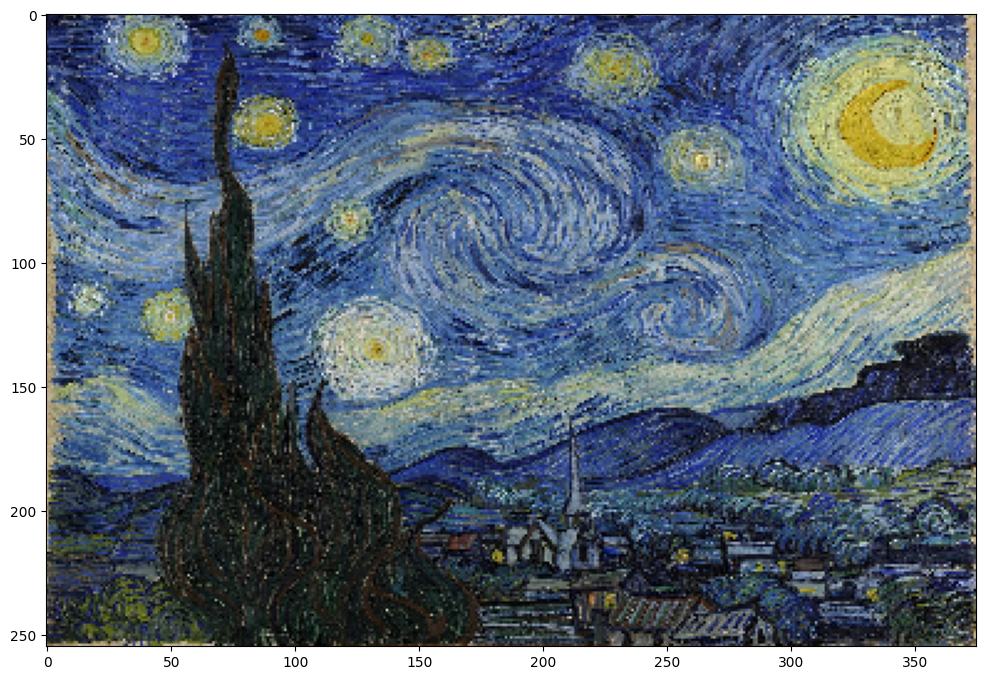

Época 0, loss 0.614254355430603


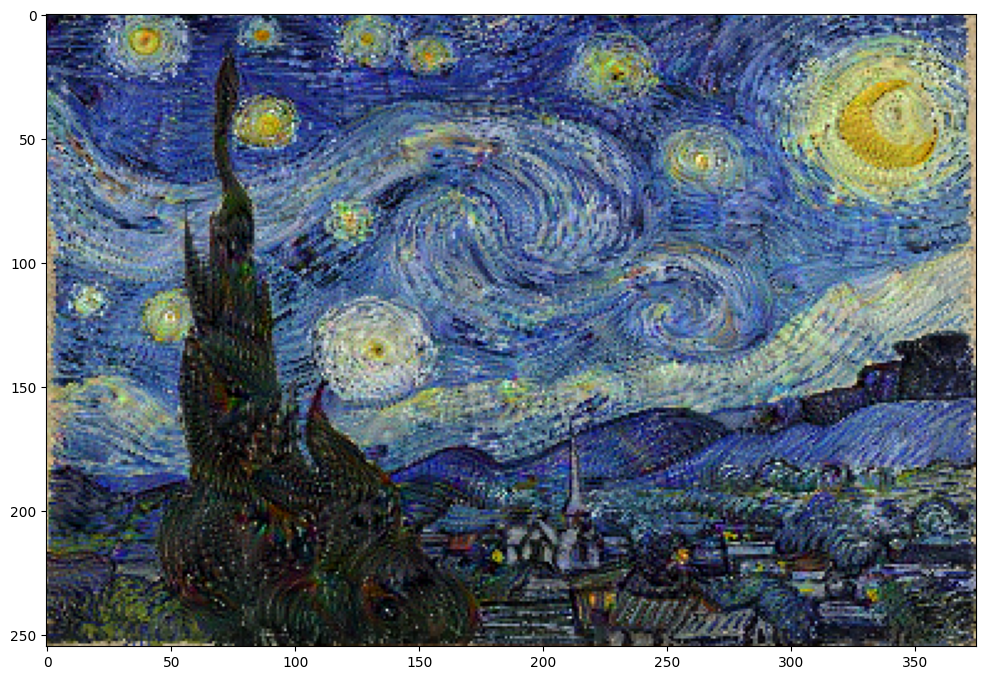

Época 200, loss 1.6892974376678467


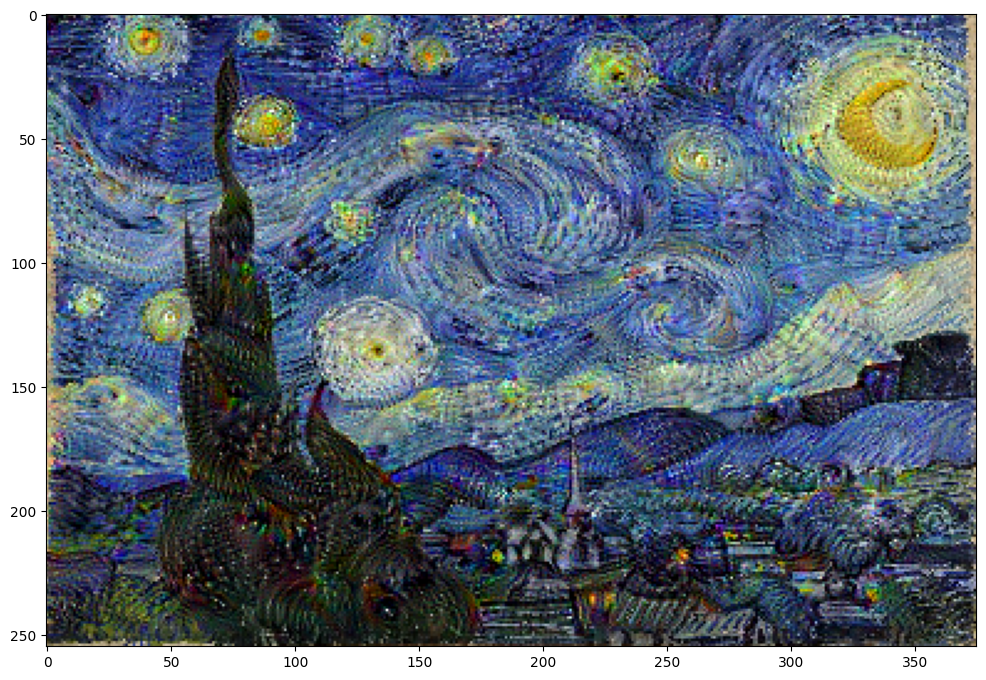

Época 400, loss 2.0023460388183594


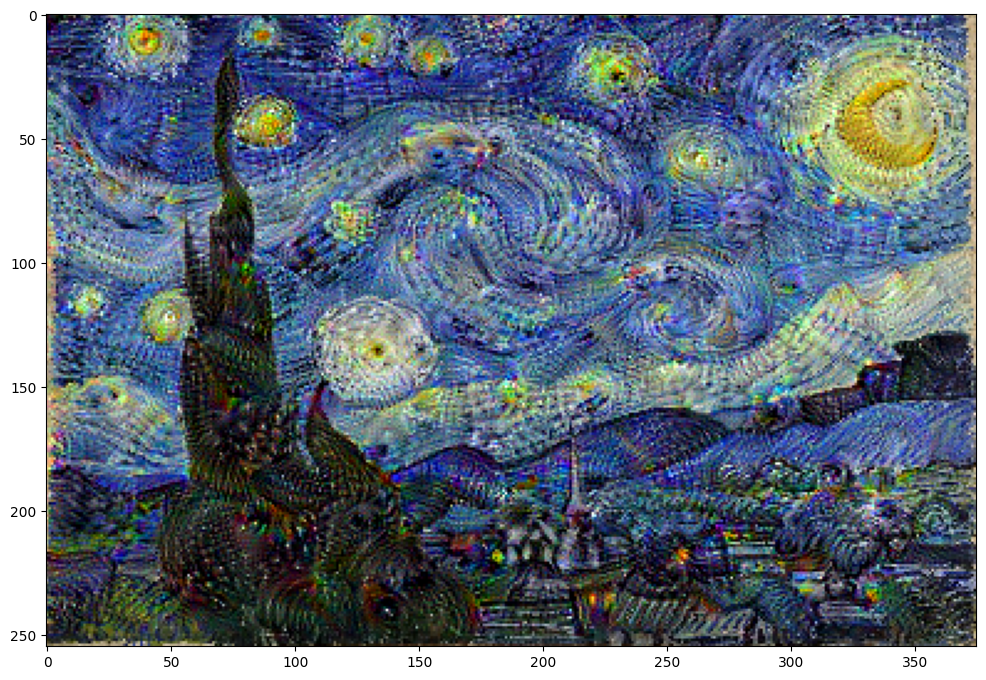

Época 600, loss 2.1884849071502686


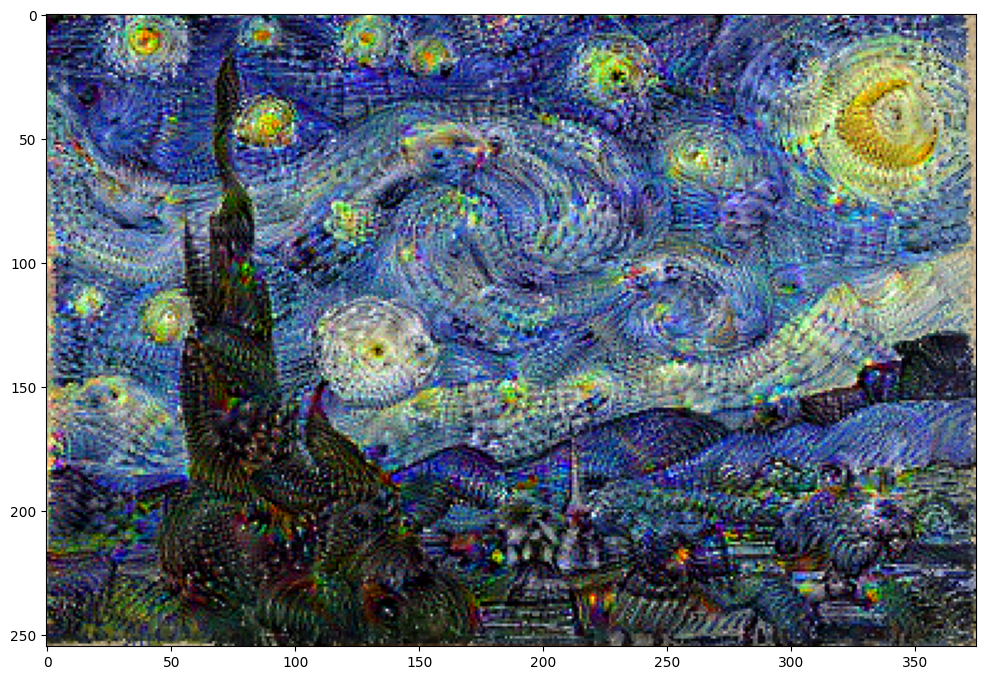

Época 800, loss 2.3352787494659424


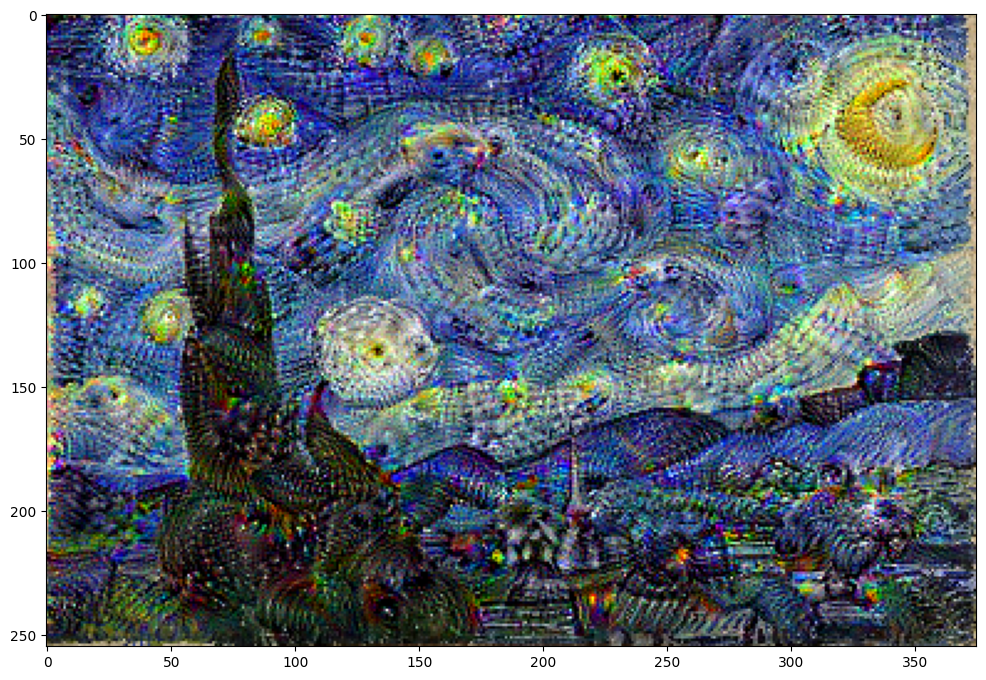

Época 1000, loss 2.456481695175171


KeyboardInterrupt: 

In [85]:
executa_deep_dream(deep_dream, imagem, 8000, 0.001)